In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
from scipy import stats
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.decomposition import PCA

In [2]:
#read in csv file
df = pd.read_csv("Pokemon_data.csv")
df

,pokedex_number,name,generation,classfication,abilities,height_m,weight_kg,type1,type2,base_total,...,against_psychic,against_rock,against_steel,against_water,capture_rate,base_egg_steps,base_happiness,is_legendary,is_mythical,is_mega
0,1,Bulbasaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",0.7,6.9,Grass,Poison,318,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
1,2,Ivysaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",1.0,13.0,Grass,Poison,405,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
2,3,Venusaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",2.0,100.0,Grass,Poison,525,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
3,3,Mega Venusaur,1,Seed Pokemon,['Thick Fat'],2.4,155.5,Grass,Poison,625,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,1
4,4,Charmander,1,Lizard Pokemon,"['Blaze', 'Solar Power']",0.6,8.5,Fire,NaN,309,...,1.0,2.0,0.5,2.0,45,"5,140",70.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028,902,Basculegion female,8,Big Fish Pokemon,"['Rattled', 'Adaptability', 'Mold Breaker']",3.0,110.0,Water,Ghost,530,...,1.0,1.0,0.5,0.5,NaN,NaN,NaN,0,0,0
1029,903,Sneasler,8,Free Climb Pokemon,"['Pressure', 'Poison Touch']",1.3,43.0,Poison,Fighting,510,...,4.0,0.5,1.0,1.0,NaN,NaN,NaN,0,0,0
1030,904,Overqwil,8,Pin Cluster Pokemon,"['Poison Point', 'Swift Swim', 'Intimidate']",2.5,60.5,Dark,Poison,510,...,0.0,1.0,1.0,1.0,NaN,NaN,NaN,0,0,0
1031,905,Enamorus Incarnate Forme,8,Love-Hate Pokemon,"['Healer', 'Contrary']",1.6,48.0,Fairy,Flying,580,...,1.0,2.0,2.0,1.0,NaN,NaN,NaN,1,0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1033 entries, 0 to 1032
Data columns (total 40 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pokedex_number    1033 non-null   int64  
 1   name              1033 non-null   object 
 2   generation        1033 non-null   int64  
 3   classfication     1033 non-null   object 
 4   abilities         1033 non-null   object 
 5   height_m          1033 non-null   float64
 6   weight_kg         1033 non-null   float64
 7   type1             1033 non-null   object 
 8   type2             546 non-null    object 
 9   base_total        1033 non-null   int64  
 10  hp                1033 non-null   int64  
 11  attack            1033 non-null   int64  
 12  defense           1033 non-null   int64  
 13  sp_attack         1033 non-null   int64  
 14  sp_defense        1033 non-null   int64  
 15  speed             1033 non-null   int64  
 16  against_bug       1033 non-null   float64


In [4]:
#count unique classification values
df.classfication.value_counts()

classfication
Mouse Pokemon         11
Dragon Pokemon         9
Fox Pokemon            9
Flame Pokemon          7
Fossil Pokemon         6
                      ..
Gripper Pokemon        1
Frog Pokemon           1
Twin Tusk Pokemon      1
Fang Scorp Pokemon     1
Wing Fish Pokemon      1
Name: count, Length: 654, dtype: int64

In [5]:
#count unique type1 values
df.type1.value_counts()

type1
Water       135
Normal      116
Grass        91
Bug          80
Psychic      79
Fire         65
Electric     61
Rock         59
Dark         46
Ground       41
Dragon       41
Fighting     40
Poison       39
Ice          37
Ghost        36
Steel        35
Fairy        24
Flying        8
Name: count, dtype: int64

In [6]:
#count unique type 2 values
df.type2.value_counts()

type2
Flying      111
Fairy        41
Ground       40
Poison       39
Psychic      39
Steel        34
Fighting     33
Dragon       31
Ghost        28
Dark         26
Grass        21
Water        20
Ice          19
Fire         17
Rock         16
Normal       11
Electric     11
Bug           9
Name: count, dtype: int64

In [7]:
#checks and removes for any rows that is a legendary, mythical, or mega pokemon
pkmn_df = df[(df['is_legendary'] == 0) & (df['is_mythical'] == 0) & (df['is_mega'] == 0)].reset_index()
pkmn_df

,index,pokedex_number,name,generation,classfication,abilities,height_m,weight_kg,type1,type2,...,against_psychic,against_rock,against_steel,against_water,capture_rate,base_egg_steps,base_happiness,is_legendary,is_mythical,is_mega
0,0,1,Bulbasaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",0.7,6.9,Grass,Poison,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
1,1,2,Ivysaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",1.0,13.0,Grass,Poison,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
2,2,3,Venusaur,1,Seed Pokemon,"['Overgrow', 'Chlorophyll']",2.0,100.0,Grass,Poison,...,2.0,1.0,1.0,0.5,45,"5,140",70.0,0,0,0
3,4,4,Charmander,1,Lizard Pokemon,"['Blaze', 'Solar Power']",0.6,8.5,Fire,NaN,...,1.0,2.0,0.5,2.0,45,"5,140",70.0,0,0,0
4,5,5,Charmeleon,1,Flame Pokemon,"['Blaze', 'Solar Power']",1.1,19.0,Fire,NaN,...,1.0,2.0,0.5,2.0,45,"5,140",70.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874,1026,901,Ursaluna,8,Peat Pokemon,"['Guts', 'Bulletproof', 'Unnerve']",2.4,290.0,Normal,Ground,...,1.0,0.5,1.0,2.0,NaN,NaN,NaN,0,0,0
875,1027,902,Basculegion male,8,Big Fish Pokemon,"['Rattled', 'Adaptability', 'Mold Breaker']",3.0,110.0,Water,Ghost,...,1.0,1.0,0.5,0.5,NaN,NaN,NaN,0,0,0
876,1028,902,Basculegion female,8,Big Fish Pokemon,"['Rattled', 'Adaptability', 'Mold Breaker']",3.0,110.0,Water,Ghost,...,1.0,1.0,0.5,0.5,NaN,NaN,NaN,0,0,0
877,1029,903,Sneasler,8,Free Climb Pokemon,"['Pressure', 'Poison Touch']",1.3,43.0,Poison,Fighting,...,4.0,0.5,1.0,1.0,NaN,NaN,NaN,0,0,0


In [8]:
#drop irrelevant columns
pkmn_df = pkmn_df.drop(['abilities','against_bug','against_dark','against_dragon','against_electric','against_fairy',
                   'against_fighting','against_fire','against_flying','against_ghost','against_grass',
                   'against_ground','against_ice','against_normal','against_poison','against_psychic',
                   'against_rock','against_steel','against_water', 'base_happiness','base_egg_steps', 'is_legendary', 'is_mythical', 'is_mega'], axis=1)
pkmn_df

,index,pokedex_number,name,generation,classfication,height_m,weight_kg,type1,type2,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
0,0,1,Bulbasaur,1,Seed Pokemon,0.7,6.9,Grass,Poison,318,45,49,49,65,65,45,45
1,1,2,Ivysaur,1,Seed Pokemon,1.0,13.0,Grass,Poison,405,60,62,63,80,80,60,45
2,2,3,Venusaur,1,Seed Pokemon,2.0,100.0,Grass,Poison,525,80,82,83,100,100,80,45
3,4,4,Charmander,1,Lizard Pokemon,0.6,8.5,Fire,NaN,309,39,52,43,60,50,65,45
4,5,5,Charmeleon,1,Flame Pokemon,1.1,19.0,Fire,NaN,405,58,64,58,80,65,80,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
874,1026,901,Ursaluna,8,Peat Pokemon,2.4,290.0,Normal,Ground,550,130,140,105,45,80,50,NaN
875,1027,902,Basculegion male,8,Big Fish Pokemon,3.0,110.0,Water,Ghost,530,120,112,65,80,75,75,NaN
876,1028,902,Basculegion female,8,Big Fish Pokemon,3.0,110.0,Water,Ghost,530,120,92,65,100,75,78,NaN
877,1029,903,Sneasler,8,Free Climb Pokemon,1.3,43.0,Poison,Fighting,510,80,130,60,40,80,120,NaN


In [9]:
#sums up all nan values
pkmn_df.isna().sum()

index               0
pokedex_number      0
name                0
generation          0
classfication       0
height_m            0
weight_kg           0
type1               0
type2             435
base_total          0
hp                  0
attack              0
defense             0
sp_attack           0
sp_defense          0
speed               0
capture_rate        7
dtype: int64

In [24]:
#replaces any empty string values in 'capture_rate' column with nan and then drop the specific rows
pkmn_df['capture_rate'].replace(' ', float('NaN'), inplace=True)
pkmn_df = pkmn_df.dropna(subset='capture_rate')
pkmn_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 871 entries, 0 to 871
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           871 non-null    Int64  
 1   pokedex_number  871 non-null    Int64  
 2   name            871 non-null    string 
 3   generation      871 non-null    Int64  
 4   classfication   871 non-null    string 
 5   height_m        871 non-null    Float64
 6   weight_kg       871 non-null    Float64
 7   type1           871 non-null    string 
 8   type2           437 non-null    string 
 9   base_total      871 non-null    Int64  
 10  hp              871 non-null    Int64  
 11  attack          871 non-null    Int64  
 12  defense         871 non-null    Int64  
 13  sp_attack       871 non-null    Int64  
 14  sp_defense      871 non-null    Int64  
 15  speed           871 non-null    Int64  
 16  capture_rate    871 non-null    int32  
dtypes: Float64(2), Int64(10), int32(1), stri

In [25]:
#converts 'capture_rate' to recommended data type
#for some reason, all three statements worked inconsistently
#I will leave all three lines of code here

#pkmn_df = pkmn_df.convert_dtypes('capture_rate')
pkmn_df.loc[:,'capture_rate'] = pkmn_df['capture_rate'].astype(int)
#pd.to_numeric(pkmn_df['capture_rate'])

In [26]:
#'capture_rate' has been converted
pkmn_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 871 entries, 0 to 871
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           871 non-null    Int64  
 1   pokedex_number  871 non-null    Int64  
 2   name            871 non-null    string 
 3   generation      871 non-null    Int64  
 4   classfication   871 non-null    string 
 5   height_m        871 non-null    Float64
 6   weight_kg       871 non-null    Float64
 7   type1           871 non-null    string 
 8   type2           437 non-null    string 
 9   base_total      871 non-null    Int64  
 10  hp              871 non-null    Int64  
 11  attack          871 non-null    Int64  
 12  defense         871 non-null    Int64  
 13  sp_attack       871 non-null    Int64  
 14  sp_defense      871 non-null    Int64  
 15  speed           871 non-null    Int64  
 16  capture_rate    871 non-null    int32  
dtypes: Float64(2), Int64(10), int32(1), stri

In [27]:
#you can see the standard dev, mean, min, max, and quartiles in describe()
pkmn_df.describe()

,index,pokedex_number,generation,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
count,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.0,871.000000
mean,499.529277,430.962113,4.026406,1.093685,51.58806,408.597015,66.576349,74.475316,69.869116,66.495982,67.270953,63.9093,105.344432
std,295.552965,261.3945,2.267814,1.060652,92.043385,99.681167,24.8605,28.92756,28.557807,27.432545,25.050479,27.241192,74.272569
min,0.0,1.0,1.0,0.1,0.1,175.0,1.0,5.0,5.0,10.0,20.0,5.0,3.000000
25%,237.5,200.5,2.0,0.5,8.15,318.0,50.0,54.5,50.0,45.0,50.0,43.0,45.000000
50%,501.0,428.0,4.0,0.9,24.5,420.0,65.0,70.0,65.0,61.0,65.0,60.0,75.000000
75%,760.5,660.5,6.0,1.4,55.9,490.0,78.0,94.5,85.0,85.0,81.0,84.0,180.000000
max,1007.0,887.0,8.0,14.5,999.9,700.0,255.0,181.0,230.0,173.0,230.0,160.0,255.000000


In [28]:
#Query Analysis p. 2-3
#Each query corresponds to the analysis on that page

#pkmn_df[pkmn_df['height_m'] == 0.1]
#pkmn_df[pkmn_df['height_m'] == 14.5]
pkmn_df[pkmn_df['hp'] == 1.0]

,index,pokedex_number,name,generation,classfication,height_m,weight_kg,type1,type2,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
306,341,292,Shedinja,3,Shed Pokemon,0.8,1.2,Bug,Ghost,236,1,90,45,30,30,40,45


<Axes: xlabel='generation'>

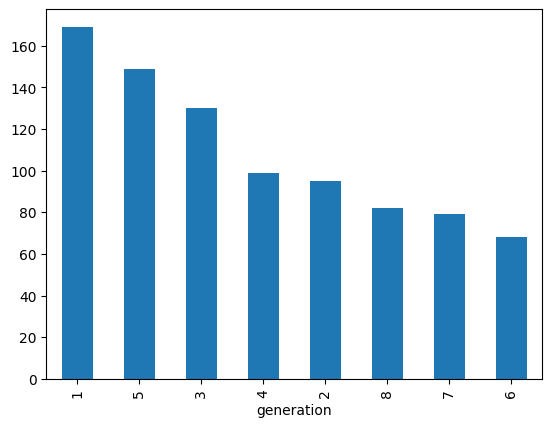

In [29]:
#plots generation value count
pkmn_df['generation'].value_counts().plot.bar()

<Axes: xlabel='type1'>

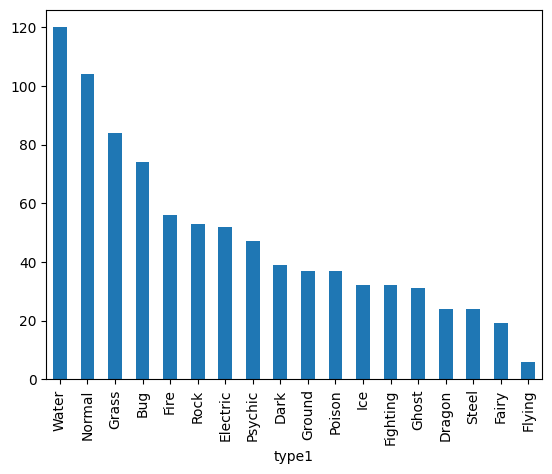

In [30]:
#plots type 1 value count
pkmn_df['type1'].value_counts().plot.bar()

<Axes: xlabel='type2'>

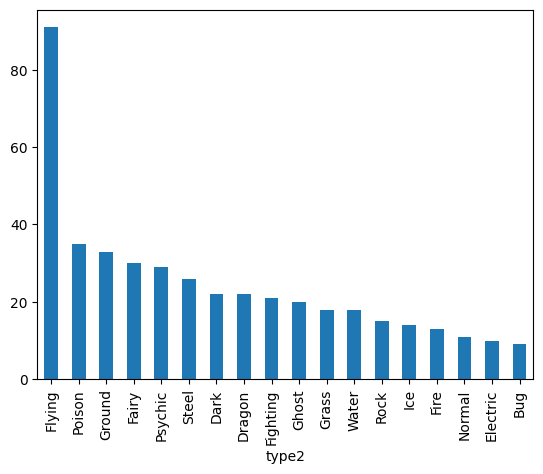

In [31]:
#plot type 2 value count
pkmn_df['type2'].value_counts().plot.bar()

In [32]:
#PREPROCESSES

#create dummies for type categoricals
pk_dummies = pd.get_dummies(pkmn_df[['type1', 'type2']])

In [33]:
#separates numeric columns
pk_numeric = pkmn_df[['height_m', 'weight_kg', 'base_total',
                      'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed', 'capture_rate']]

In [34]:
pk_numeric

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
0,0.7,6.9,318,45,49,49,65,65,45,45
1,1.0,13.0,405,60,62,63,80,80,60,45
2,2.0,100.0,525,80,82,83,100,100,80,45
3,0.6,8.5,309,39,52,43,60,50,65,45
4,1.1,19.0,405,58,64,58,80,65,80,45
...,...,...,...,...,...,...,...,...,...,...
867,2.0,175.0,505,90,90,100,80,90,55,45
868,1.8,40.0,535,70,95,115,120,50,85,45
869,0.5,2.0,270,28,60,30,40,30,82,45
870,1.4,11.0,410,68,80,50,60,50,102,45


In [35]:
#concatenate them, leave out pokedex number
pk_preproc = pd.concat([
    pk_numeric,
    pk_dummies
], axis=1)
pk_preproc

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate,...,type2_Ghost,type2_Grass,type2_Ground,type2_Ice,type2_Normal,type2_Poison,type2_Psychic,type2_Rock,type2_Steel,type2_Water
0,0.7,6.9,318,45,49,49,65,65,45,45,...,False,False,False,False,False,True,False,False,False,False
1,1.0,13.0,405,60,62,63,80,80,60,45,...,False,False,False,False,False,True,False,False,False,False
2,2.0,100.0,525,80,82,83,100,100,80,45,...,False,False,False,False,False,True,False,False,False,False
3,0.6,8.5,309,39,52,43,60,50,65,45,...,False,False,False,False,False,False,False,False,False,False
4,1.1,19.0,405,58,64,58,80,65,80,45,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867,2.0,175.0,505,90,90,100,80,90,55,45,...,False,False,False,True,False,False,False,False,False,False
868,1.8,40.0,535,70,95,115,120,50,85,45,...,False,False,False,False,False,False,False,False,False,False
869,0.5,2.0,270,28,60,30,40,30,82,45,...,True,False,False,False,False,False,False,False,False,False
870,1.4,11.0,410,68,80,50,60,50,102,45,...,True,False,False,False,False,False,False,False,False,False


In [36]:
#normalizes the numerics
pk_preproc_norm = pd.concat([
    (pk_numeric - pk_numeric.mean())/pk_numeric.std(),
    pk_dummies
], axis=1)
pk_preproc_norm

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate,...,type2_Ghost,type2_Grass,type2_Ground,type2_Ice,type2_Normal,type2_Poison,type2_Psychic,type2_Rock,type2_Steel,type2_Water
0,-0.371173,-0.485511,-0.908868,-0.867897,-0.880659,-0.730767,-0.054533,-0.090655,-0.694144,-0.812473,...,False,False,False,False,False,True,False,False,False,False
1,-0.088328,-0.419238,-0.036085,-0.26453,-0.431261,-0.240534,0.492263,0.508136,-0.143507,-0.812473,...,False,False,False,False,False,True,False,False,False,False
2,0.854488,0.525969,1.167753,0.539959,0.260122,0.4598,1.221324,1.306524,0.590675,-0.812473,...,False,False,False,False,False,True,False,False,False,False
3,-0.465455,-0.468128,-0.999156,-1.109244,-0.776952,-0.940868,-0.236798,-0.689446,0.040039,-0.812473,...,False,False,False,False,False,False,False,False,False,False
4,0.005953,-0.354051,-0.036085,-0.344979,-0.362122,-0.415617,0.492263,-0.090655,0.590675,-0.812473,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867,0.854488,1.340802,0.967113,0.942204,0.536675,1.055084,0.492263,0.90733,-0.327052,-0.812473,...,False,False,False,True,False,False,False,False,False,False
868,0.665925,-0.125898,1.268073,0.137714,0.70952,1.580334,1.950385,-0.689446,0.774221,-0.812473,...,False,False,False,False,False,False,False,False,False,False
869,-0.559736,-0.538747,-1.390403,-1.551713,-0.500399,-1.396085,-0.965859,-1.487834,0.664094,-0.812473,...,True,False,False,False,False,False,False,False,False,False
870,0.288798,-0.440967,0.014075,0.057266,0.190983,-0.695751,-0.236798,-0.689446,1.398276,-0.812473,...,True,False,False,False,False,False,False,False,False,False


<Axes: >

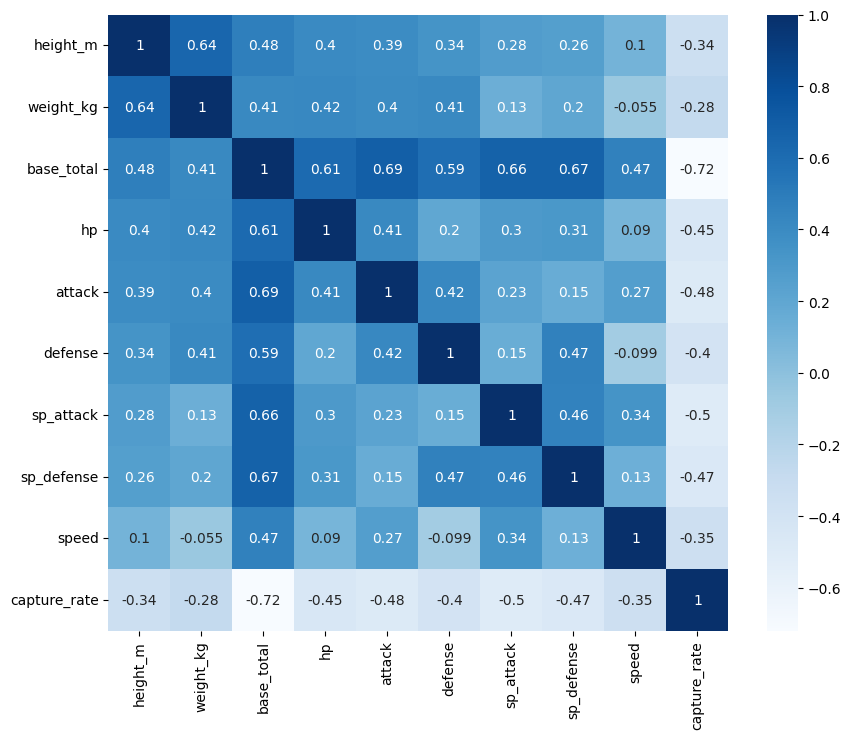

In [39]:
#plots correlation matrices

plt.figure(figsize=(10,8))
sns.heatmap(pk_numeric.corr(), annot=True, cmap="Blues")
#Couldn't do on the categoricals, would result in extremely large matrices 
#However, my hypothesis is that height and weight may have dependence on classification

In [40]:
#Query Example p. 6
pkmn_df[(pkmn_df['speed'] > 110) & (pkmn_df['weight_kg'] > 140.0)]
pkmn_df[(pkmn_df['speed'] < 30) & (pkmn_df['weight_kg'] < 5.0)]

,index,pokedex_number,name,generation,classfication,height_m,weight_kg,type1,type2,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
190,209,173,Cleffa,2,Star Shape Pokemon,0.3,3.0,Fairy,<NA>,218,50,25,28,45,55,15,150
191,210,174,Igglybuff,2,Balloon Pokemon,0.3,1.0,Normal,Fairy,210,90,30,15,40,20,15,170
192,211,175,Togepi,2,Spike Ball Pokemon,0.3,1.5,Fairy,<NA>,245,35,20,65,40,65,20,190
279,313,265,Wurmple,3,Worm Pokemon,0.3,3.6,Bug,<NA>,195,45,45,35,20,30,20,255
312,347,298,Azurill,3,Polka Dot Pokemon,0.2,2.0,Normal,Fairy,190,50,20,40,20,40,20,150
408,474,401,Kricketot,4,Cricket Pokemon,0.3,2.2,Bug,<NA>,194,37,25,41,25,41,25,255
581,669,577,Solosis,5,Cell Pokemon,0.3,1.0,Psychic,<NA>,290,45,30,40,105,50,20,200
594,682,590,Foongus,5,Mushroom Pokemon,0.2,1.0,Grass,Poison,294,69,55,45,55,55,15,190
611,699,607,Litwick,5,Candle Pokemon,0.3,3.1,Ghost,Fire,275,50,30,55,65,55,20,190
673,780,679,Honedge,6,Sword Pokemon,0.8,2.0,Steel,Ghost,325,45,80,100,35,37,28,180


<Axes: xlabel='height_m', ylabel='weight_kg'>

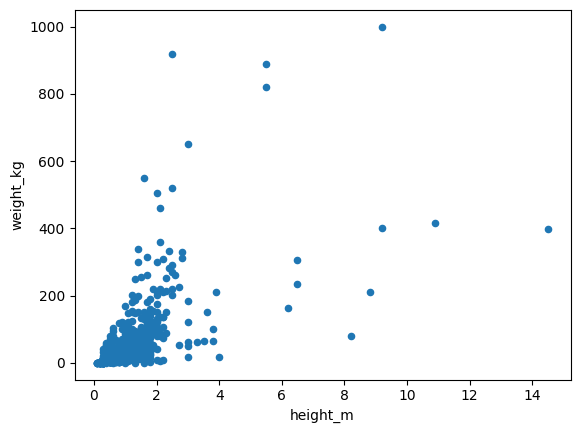

In [41]:
#Plotting a few correlations
pkmn_df.plot.scatter(x='height_m', y='weight_kg')

<Axes: xlabel='base_total', ylabel='attack'>

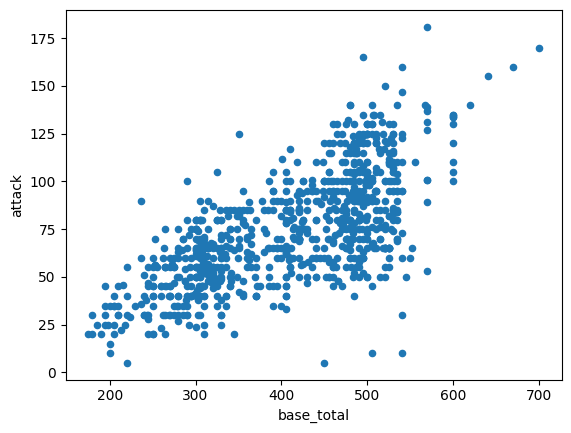

In [42]:
pkmn_df.plot.scatter(x='base_total', y='attack')

<Axes: xlabel='base_total', ylabel='speed'>

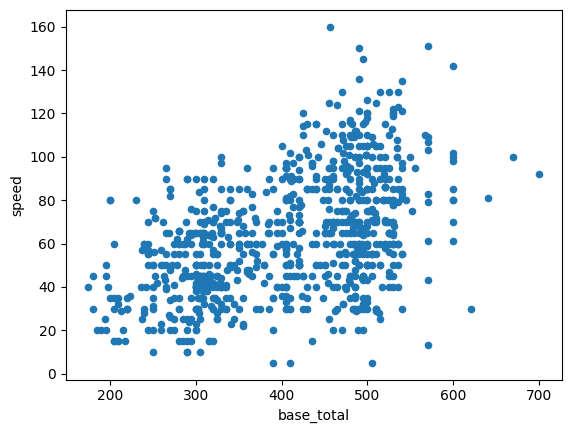

In [43]:
#More loosely correlated graph
pkmn_df.plot.scatter(x='base_total', y='speed')

<Axes: xlabel='base_total', ylabel='capture_rate'>

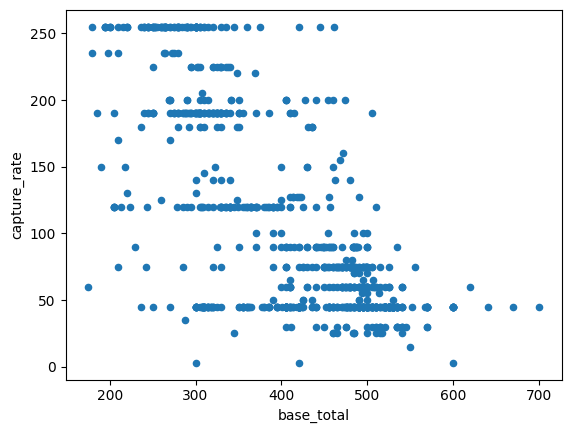

In [44]:
pkmn_df.plot.scatter(x='base_total', y='capture_rate')

<Axes: xlabel='generation', ylabel='attack'>

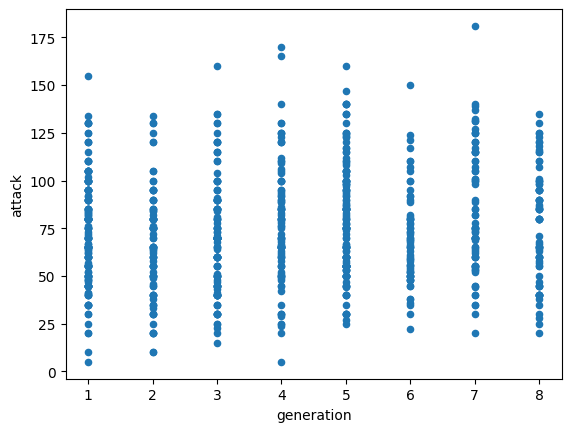

In [45]:
pkmn_df.plot.scatter(x='generation', y='attack')

<Axes: xlabel='weight_kg', ylabel='speed'>

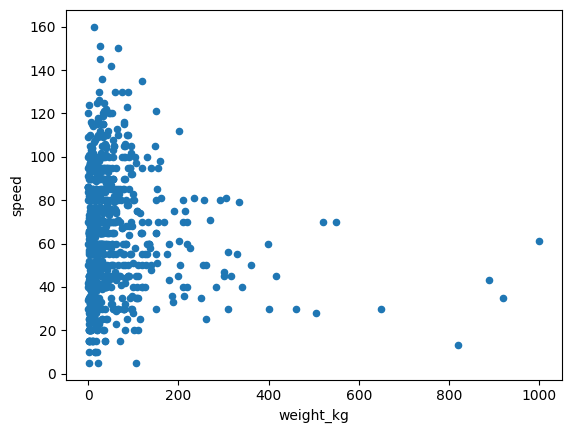

In [46]:
#Poor correlation
pkmn_df.plot.scatter(x='weight_kg', y='speed')

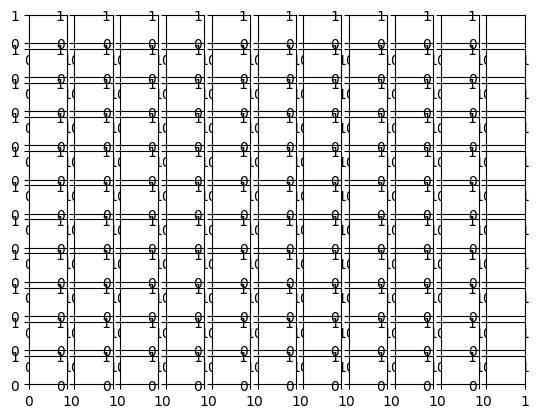

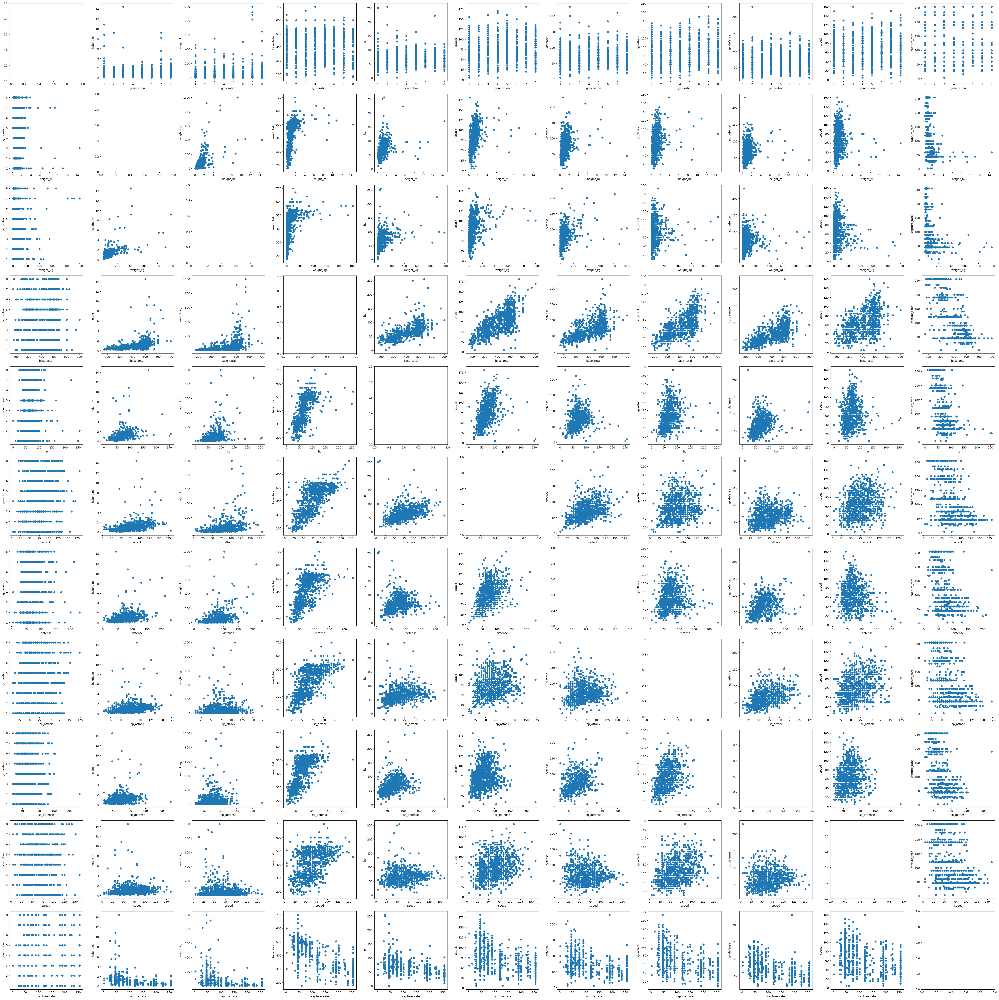

In [47]:
#plots all possible x, y combinations

fig, ax = plt.subplots(11, 11)
columns = ['generation', 'height_m', 'weight_kg', 'base_total', 'hp',
          'attack', 'defense', 'sp_attack', 'sp_defense', 'speed', 'capture_rate']
fig, ax = plt.subplots(11, 11, figsize=(50,50))

for i, x in enumerate(columns):
  for j, y in enumerate(columns):
    if i == j:
      continue
    ax[i, j].scatter(pkmn_df[x], pkmn_df[y])
    ax[i, j].set_xlabel(x)
    ax[i, j].set_ylabel(y)

plt.tight_layout()

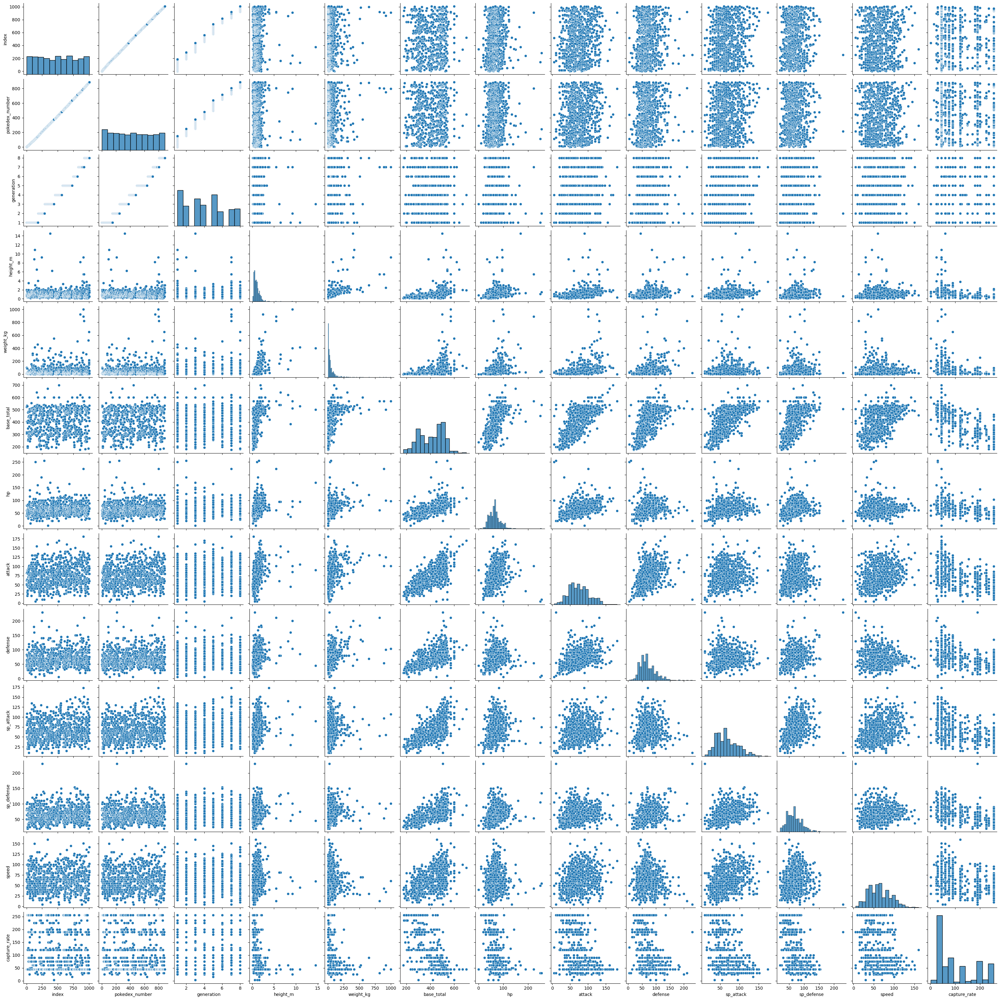

In [48]:
#pair plot

sns.pairplot(pkmn_df)

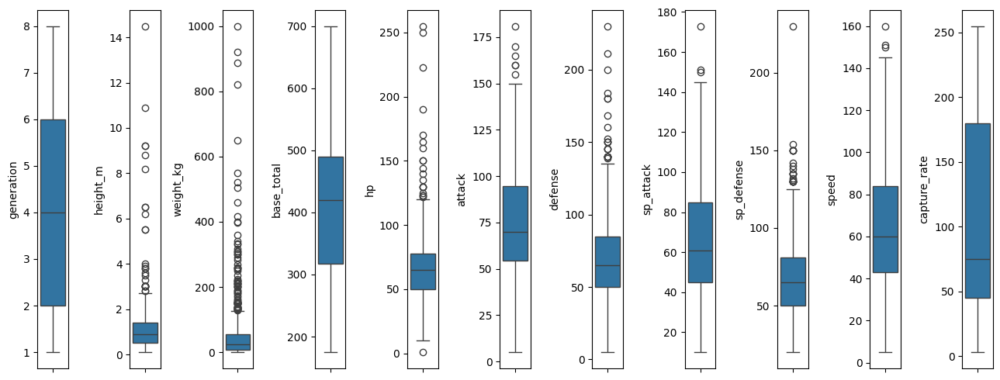

In [49]:
#box plotting to view the stats above + identify outliers in numeric columns
col = ['generation', 'height_m', 'weight_kg', 'base_total', 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed', 'capture_rate']
num_col = len(col)

plt.figure(figsize=(13,5))
for i in range(num_col):
    plt.subplot(1, num_col, i+1)

    sns.boxplot(y=pkmn_df[col[i]])

    plt.tight_layout()

#frequent outliers seem to be in height, weight, hp, attack, defense, sp_attack, sp_defense, speed, but they are important enough to not be removed

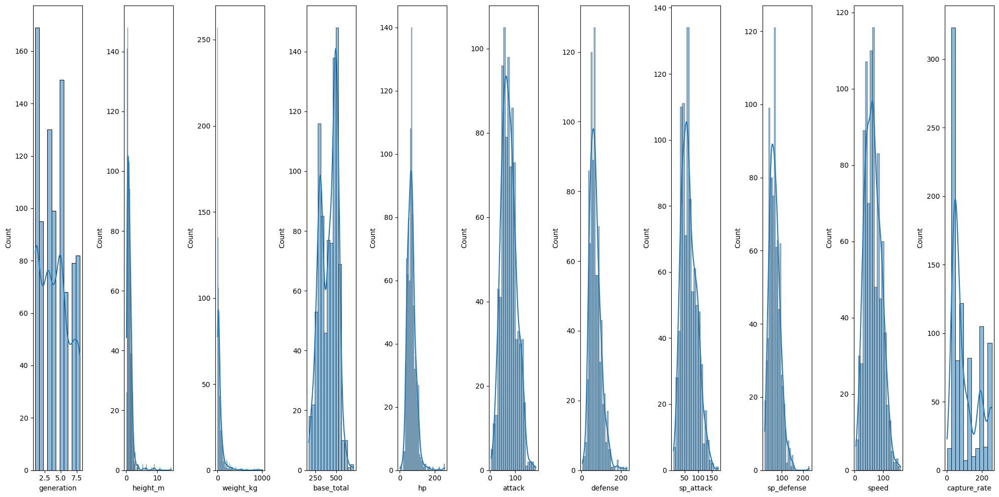

In [50]:
#Histogram for distribution, normal or skewed visually

plt.figure(figsize=(20,10))

for i in range(num_col):
    data = pkmn_df[col[i]]

    plt.subplot(1, num_col, i+1)
    sns.histplot(data, kde=True)
    plt.tight_layout()

In [51]:
pd.set_option('display.max_rows', 1000)

1 ----- Using Pandas Functions -------------------------------------------------------------------------------------------------------------------------

In [52]:
#How many pokemon are in each classification?
pkmn_class_ct = pkmn_df.groupby('classfication')['pokedex_number'].count().reset_index(name='count').sort_values(by='count', ascending=False)
#pkmn_class_ct.info()
#pkmn_class_ct[pkmn_class_ct['count']==1].count()
pkmn_class_ct

,classfication,count
336,Mouse Pokemon,11
204,Fox Pokemon,9
151,Dragon Pokemon,8
373,Poison Pin Pokemon,6
364,Plasma Pokemon,6
340,Mushroom Pokemon,6
27,Balloon Pokemon,5
203,Fossil Pokemon,5
332,Mole Pokemon,5
109,Cocoon Pokemon,4


In [53]:
#Which classification has greater than or equal to 5 pokemon?
fiveup = pkmn_class_ct[pkmn_class_ct['count'] >= 5]

In [54]:
#What are the average height and weight of each pokemon classification with a count of 5 and up? Hp, attack, defense, special defense, special attack, and speed?
cls_ct_filter = pd.merge(fiveup, pkmn_df, how='left', on='classfication')
cls_ct_filter.groupby('classfication')[['height_m', 'weight_kg', 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed']].mean()

,height_m,weight_kg,hp,attack,defense,sp_attack,sp_defense,speed
classfication,,,,,,,,
Balloon Pokemon,0.54,4.72,100.0,58.0,39.8,57.0,38.8,47.0
Dragon Pokemon,1.8625,83.4875,67.25,89.625,76.875,87.5,76.875,76.25
Fossil Pokemon,2.04,157.8,88.0,97.0,89.0,76.0,79.0,78.0
Fox Pokemon,0.9,16.811111,56.222222,53.777778,54.0,73.555556,78.222222,79.555556
Mole Pokemon,0.42,22.04,30.0,79.0,41.0,40.0,55.0,96.6
Mouse Pokemon,0.672727,22.254545,54.090909,76.727273,68.181818,43.181818,56.363636,76.181818
Mushroom Pokemon,0.616667,15.016667,66.333333,79.166667,65.0,57.5,65.0,34.166667
Plasma Pokemon,0.3,0.3,50.0,62.5,102.0,103.333333,102.0,86.833333
Poison Pin Pokemon,1.133333,34.55,62.0,64.0,59.333333,65.0,55.0,67.666667


In [55]:
#Classification has exactly 6 pokemon, which one between the group has highest mean stats? Lowest mean stats?
filtered = pkmn_df.groupby('classfication').filter(lambda x: len(x) == 6)
#filtered.groupby('classfication')['hp'].mean() #Mishroom Pokemon, PLasma Pokemon
#filtered.groupby('classfication')['attack'].mean() #Mushroom Pokemon, Plasma Pokemon
#filtered.groupby('classfication')['speed'].mean() #Plasma Pokemon, Mushroom Pokemon
#filtered.groupby('classfication')['height_m'].mean() #Poison Pin Pokemon, Plasma Pokemon
#filtered.groupby('classfication')['weight_kg'].mean() #Poison Pin Pokemon, Plasma Pokemon
#filtered.groupby('classfication')['defense'].mean() #Plasma Pokemon, Poison Pin Pokemon
#filtered.groupby('classfication')['sp_attack'].mean() #Plasma Pokemon, Mushroom Pokemon
filtered.groupby('classfication')['sp_defense'].mean() #Plasma Pokemon, Poison Pin Pokemon

classfication
Mushroom Pokemon       65.0
Plasma Pokemon        102.0
Poison Pin Pokemon     55.0
Name: sp_defense, dtype: Float64

In [56]:
#What are the average height and weight of each pokemon primary type? Hp, attack, defense, special defense, special attack, and speed?
prim_type_stats = pkmn_df.groupby('type1')[['height_m', 'weight_kg', 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed']].mean()
prim_type_stats

,height_m,weight_kg,hp,attack,defense,sp_attack,sp_defense,speed
type1,,,,,,,,
Bug,0.855405,31.997297,56.054054,65.797297,69.27027,55.594595,62.175676,61.527027
Dark,1.020513,51.810256,67.74359,77.384615,61.512821,63.948718,63.384615,73.307692
Dragon,1.441667,60.804167,68.416667,96.375,73.25,68.25,72.0,73.666667
Electric,0.846154,32.138462,59.192308,70.711538,64.653846,84.038462,69.961538,80.365385
Fairy,0.621053,11.042105,68.157895,56.157895,64.578947,76.105263,86.0,48.684211
Fighting,1.234375,58.278125,70.53125,97.59375,68.0,50.5,63.6875,61.625
Fire,1.057143,45.728571,66.517857,80.214286,63.696429,79.785714,66.767857,72.982143
Flying,1.0,33.966667,66.5,64.333333,60.833333,59.333333,65.0,77.333333
Ghost,1.0,35.703226,59.225806,68.193548,75.709677,82.967742,78.774194,56.709677


In [57]:
#Which primary type has the highest mean of each stat? Lowest? Display the values as well.
highesttype = prim_type_stats['speed'].idxmax()
highesttypeval = prim_type_stats['speed'].max()
print(highesttype, " ", highesttypeval)
#Height_m: Steel 1.78
#Weight_kg: Steel 174.32
#HP: Normal 75.19
#Attack: Fighting 97.59
#Defense: Steel 108.92
#Sp_attack: Psychic 84.85
#Sp_defense: Fairy 86.0
#Speed: Electric 80.37


Electric   80.36538461538461


In [58]:
#Lowest
lowesttype = prim_type_stats['speed'].idxmin()
lowesttypeval = prim_type_stats['speed'].min()
print(lowesttype, " ", lowesttypeval)
#Height_m: Fairy 0.62
#Weight_kg: Fairy 11.04
#HP: Bug 56.05
#Attack: Psychic 52.72
#Defense: Normal 57.48
#Sp_attack: Ground 47.78
#Sp_defense: Normal 60.62
#Speed: Fairy 48.68

Fairy   48.68421052631579


In [59]:
#Which primary type is most commmon in each generation?
pkmn_df.groupby(['generation', 'type1'])['pokedex_number'].count().reset_index(name='count').sort_values(by=['count','generation'], ascending=False)
#Gen 1: Water 39 | Gen 2: Water 17 | Gen 3: Water 24 | Gen 4: Normal 15
#Gen 5: Bug 17 & Water 17 | Gen 7: Grass 11 | Gen 8: Electric 10

,generation,type1,count
15,1,Water,29
47,3,Water,24
11,1,Normal,22
42,3,Normal,18
65,5,Bug,17
80,5,Water,17
31,2,Water,17
12,1,Poison,17
75,5,Normal,16
59,4,Normal,15


In [60]:
#What is the most common secondary type that is not null? Flying 91
#Least Common? Bug 9
pkmn_df.groupby('type2').size()

type2
Bug          9
Dark        22
Dragon      22
Electric    10
Fairy       30
Fighting    21
Fire        13
Flying      91
Ghost       20
Grass       18
Ground      33
Ice         14
Normal      11
Poison      35
Psychic     29
Rock        15
Steel       26
Water       18
dtype: int64

In [61]:
#What is a common secondary type for Grass primary types? Poison Type
grass_pkmn = pkmn_df[pkmn_df['type1'] == 'Grass']
grass_pkmn['type2'].value_counts().idxmax()

'Poison'

 --------- Pandas Operations end  ----------------------------------------------------------------------------------------------------------------------

2 ----- Chi-square Analysis ----------------------------------------------------------------------------------------------------------------------------

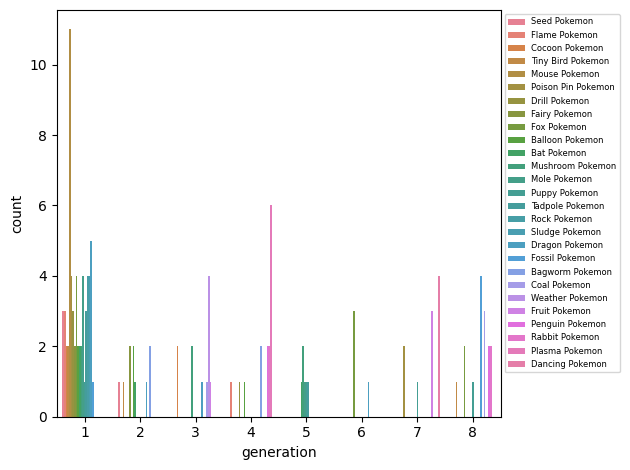

In [62]:
#we're going to operate on pokemon with only count of >=4. Anything under seems redundant as there will be little to no cross generation distribution

#merge the count of each class with the class in pkmn_df so it displays the counts
pkdf_count = pd.merge(pkmn_df, pkmn_class_ct)
#filter for over 4 count
filtered_cls = pkdf_count[pkdf_count['count'] >=4]
#plot a bar graph
sns.countplot(filtered_cls, x='generation', hue='classfication').legend(bbox_to_anchor=(1, 1), loc='upper left', prop={'size':6})
plt.tight_layout()
plt.show()

In [63]:
#construct a contingency table
pk_contingency = pd.crosstab(filtered_cls['classfication'], filtered_cls['generation'])
pk_contingency

generation,1,2,3,4,5,6,7,8
classfication,,,,,,,,
Bagworm Pokemon,0,2,0,2,0,0,0,0
Balloon Pokemon,2,2,0,1,0,0,0,0
Bat Pokemon,2,1,0,0,1,0,0,0
Coal Pokemon,0,0,1,0,0,0,0,3
Cocoon Pokemon,2,0,2,0,0,0,0,0
Dancing Pokemon,0,0,0,0,0,0,4,0
Dragon Pokemon,5,1,1,0,0,1,0,0
Drill Pokemon,3,0,0,1,0,0,0,0
Fairy Pokemon,2,2,0,0,0,0,0,0


In [64]:
#calculate chi2_contingency on the table
chi_result = stats.chi2_contingency(pk_contingency)
chi_result

Chi2ContingencyResult(statistic=416.8048206527642, pvalue=1.837108449348639e-20, dof=182, expected_freq=array([[1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.45112782],
       [2.33082707, 0.37593985, 0.41353383, 0.56390977, 0.22556391,
        0.15037594, 0.37593985, 0.56390977],
       [1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.45112782],
       [1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.45112782],
       [1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.45112782],
       [1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.45112782],
       [3.72932331, 0.60150376, 0.66165414, 0.90225564, 0.36090226,
        0.2406015 , 0.60150376, 0.90225564],
       [1.86466165, 0.30075188, 0.33082707, 0.45112782, 0.18045113,
        0.12030075, 0.30075188, 0.451

<Axes: xlabel='generation', ylabel='classfication'>

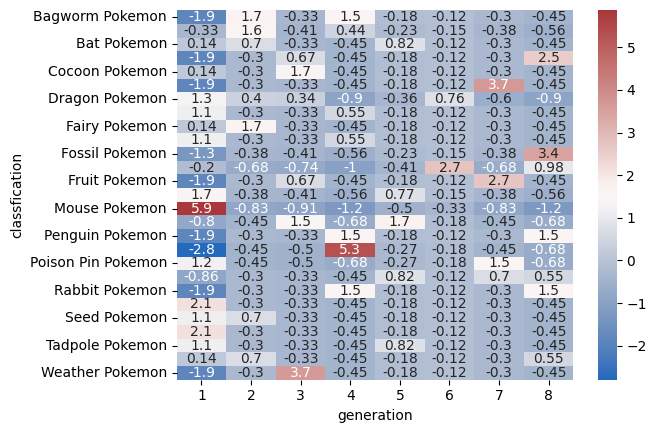

In [65]:
#On observation, majority of the classifications seem heavily screwed based on generation. 
#construct a heatmap for contingency matrices
sns.heatmap(
    pk_contingency - chi_result.expected_freq,
    cmap='vlag',
    annot=True
)

In [66]:
#Type versus Generation

#group by type 1 and count
type1_ct = pkmn_df.groupby('type1')['pokedex_number'].count()
type1_ct

type1
Bug          74
Dark         39
Dragon       24
Electric     52
Fairy        19
Fighting     32
Fire         56
Flying        6
Ghost        31
Grass        84
Ground       37
Ice          32
Normal      104
Poison       37
Psychic      47
Rock         53
Steel        24
Water       120
Name: pokedex_number, dtype: Int64

In [67]:
#group by type 2 and count

type2_ct = pkmn_df.groupby('type2')['pokedex_number'].count()
type2_ct

type2
Bug          9
Dark        22
Dragon      22
Electric    10
Fairy       30
Fighting    21
Fire        13
Flying      91
Ghost       20
Grass       18
Ground      33
Ice         14
Normal      11
Poison      35
Psychic     29
Rock        15
Steel       26
Water       18
Name: pokedex_number, dtype: Int64

In [68]:
#add both series values

type_ct = type1_ct.add(type2_ct)
type_ct

type1
Bug          83
Dark         61
Dragon       46
Electric     62
Fairy        49
Fighting     53
Fire         69
Flying       97
Ghost        51
Grass       102
Ground       70
Ice          46
Normal      115
Poison       72
Psychic      76
Rock         68
Steel        50
Water       138
Name: pokedex_number, dtype: Int64

In [69]:
#create separate Dataframe for type 1 and type 2
pk_type1 = pkmn_df.loc[:, ['pokedex_number', 'generation', 'type1']]
pk_type2 = pkmn_df.loc[:, ['pokedex_number', 'generation', 'type2']]

#drop all the null values for type 2
pk_type2 = pk_type2.dropna(subset='type2').reset_index()

#rename both columns to "type"
pk_type1 = pk_type1.rename(columns={'type1': 'type'})
pk_type2 = pk_type2.rename(columns={'type2': 'type'})

In [70]:
pk_type1

,pokedex_number,generation,type
0,1,1,Grass
1,2,1,Grass
2,3,1,Grass
3,4,1,Fire
4,5,1,Fire
5,6,1,Fire
6,7,1,Water
7,8,1,Water
8,9,1,Water
9,10,1,Bug


In [71]:
pk_type2

,index,pokedex_number,generation,type
0,0,1,1,Poison
1,1,2,1,Poison
2,2,3,1,Poison
3,5,6,1,Flying
4,11,12,1,Flying
5,12,13,1,Poison
6,13,14,1,Poison
7,14,15,1,Poison
8,15,16,1,Flying
9,16,17,1,Flying


In [72]:
#concat the two dataframes
type_df = pd.concat([pk_type1, pk_type2]).reset_index()

#drop any extraneous columns
type_df = type_df.drop(columns=['index'])
type_df

,level_0,pokedex_number,generation,type
0,0,1,1,Grass
1,1,2,1,Grass
2,2,3,1,Grass
3,3,4,1,Fire
4,4,5,1,Fire
...,...,...,...,...
1303,432,883,8,Ice
1304,433,884,8,Dragon
1305,434,885,8,Ghost
1306,435,886,8,Ghost


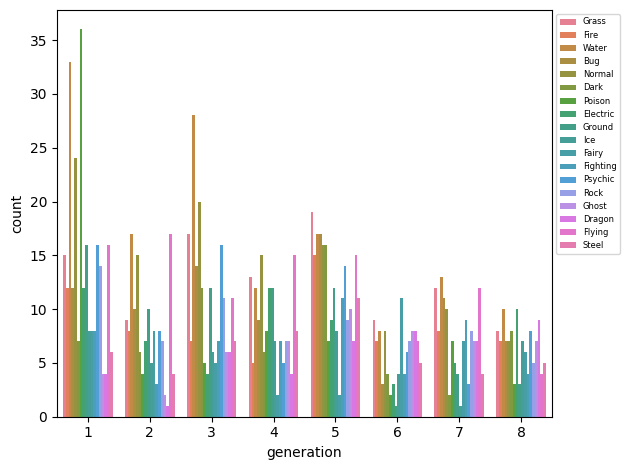

In [73]:
#make a count plot
sns.countplot(type_df, x='generation', hue='type').legend(bbox_to_anchor=(1, 1), loc='upper left', prop={'size':6})
plt.tight_layout()
plt.show()

In [74]:
#contingency table
type_contingency = pd.crosstab(type_df['type'], type_df['generation'])
type_contingency

generation,1,2,3,4,5,6,7,8
type,,,,,,,,
Bug,12,10,14,9,17,3,11,7
Dark,7,6,12,6,16,4,2,8
Dragon,4,1,6,4,7,8,7,9
Electric,12,7,4,12,9,3,5,10
Fairy,8,8,5,2,2,11,7,6
Fighting,8,3,7,7,11,4,9,4
Fire,12,8,7,5,15,7,8,7
Flying,16,17,11,15,15,7,12,4
Ghost,4,2,6,7,10,8,7,7


In [75]:
#calculate chi2 contingency
ctype_result = stats.chi2_contingency(type_contingency)
ctype_result

Chi2ContingencyResult(statistic=188.95018519409567, pvalue=4.705866615655822e-05, dof=119, expected_freq=array([[15.92737003,  8.94724771, 12.31039755,  9.77217125, 13.64296636,
         6.66284404,  8.24923547,  7.48776758],
       [11.70565749,  6.57568807,  9.04740061,  7.18195719, 10.02675841,
         4.89678899,  6.06269113,  5.5030581 ],
       [ 8.82721713,  4.9587156 ,  6.82262997,  5.41590214,  7.56116208,
         3.69266055,  4.57186544,  4.14984709],
       [11.89755352,  6.68348624,  9.19571865,  7.29969419, 10.1911315 ,
         4.97706422,  6.16207951,  5.59327217],
       [ 9.4029052 ,  5.28211009,  7.2675841 ,  5.76911315,  8.05428135,
         3.93348624,  4.87003058,  4.4204893 ],
       [10.1704893 ,  5.71330275,  7.86085627,  6.24006116,  8.7117737 ,
         4.25458716,  5.2675841 ,  4.78134557],
       [13.24082569,  7.43807339, 10.23394495,  8.12385321, 11.34174312,
         5.53899083,  6.85779817,  6.22477064],
       [18.61391437, 10.45642202, 14.38685015, 1

<Axes: xlabel='generation', ylabel='type'>

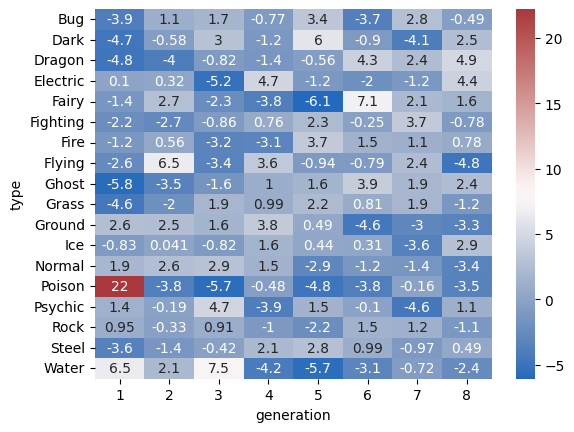

In [76]:
#primary type also seem to vary by generation
#contingency matrices
sns.heatmap(
    type_contingency - ctype_result.expected_freq,
    cmap='vlag',
    annot=True
)

In [77]:
#between type1 and type2
#pkmn_df

#dropall type 2 == nan rows
types_filter = pkmn_df.dropna().reset_index()
types_filter


,level_0,index,pokedex_number,name,generation,classfication,height_m,weight_kg,type1,type2,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
0,0,0,1,Bulbasaur,1,Seed Pokemon,0.7,6.9,Grass,Poison,318,45,49,49,65,65,45,45
1,1,1,2,Ivysaur,1,Seed Pokemon,1.0,13.0,Grass,Poison,405,60,62,63,80,80,60,45
2,2,2,3,Venusaur,1,Seed Pokemon,2.0,100.0,Grass,Poison,525,80,82,83,100,100,80,45
3,5,6,6,Charizard,1,Flame Pokemon,1.7,90.5,Fire,Flying,534,78,84,78,109,85,100,45
4,11,15,12,Butterfree,1,Butterfly Pokemon,1.1,32.0,Bug,Flying,395,60,45,50,90,80,70,45
5,12,16,13,Weedle,1,Hairy Bug Pokemon,0.3,3.2,Bug,Poison,195,40,35,30,20,20,50,255
6,13,17,14,Kakuna,1,Cocoon Pokemon,0.6,10.0,Bug,Poison,205,45,25,50,25,25,35,120
7,14,18,15,Beedrill,1,Poison Bee Pokemon,1.0,29.5,Bug,Poison,395,65,90,40,45,80,75,45
8,15,20,16,Pidgey,1,Tiny Bird Pokemon,0.3,1.8,Normal,Flying,251,40,45,40,35,35,56,255
9,16,21,17,Pidgeotto,1,Bird Pokemon,1.1,30.0,Normal,Flying,349,63,60,55,50,50,71,120


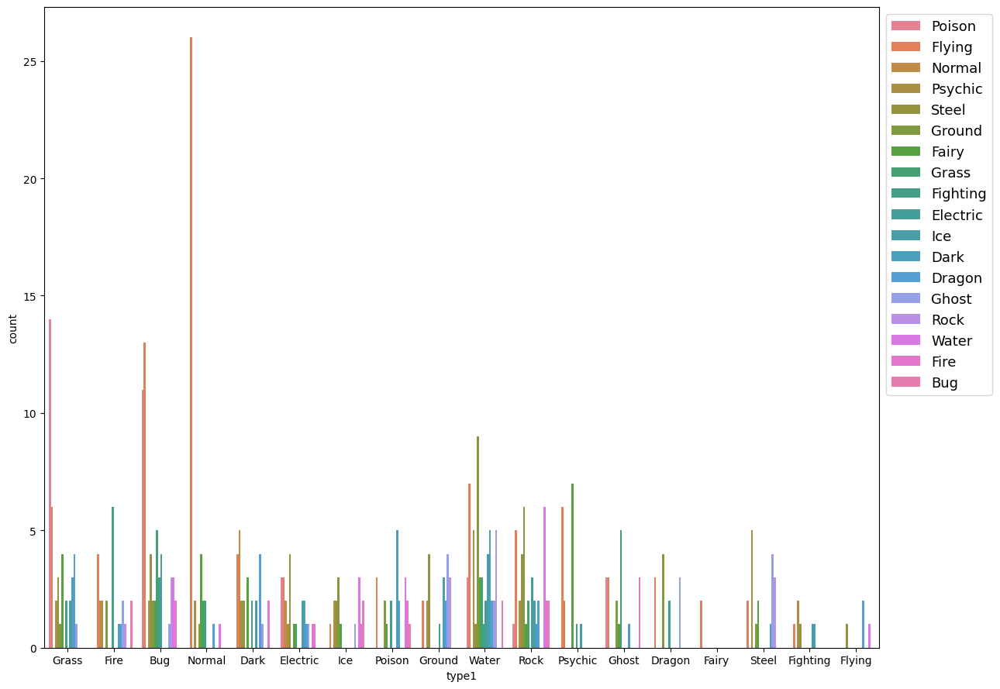

In [78]:
#plot the countplot
plt.figure(figsize=(13, 9))
sns.countplot(types_filter, x='type1', hue='type2').legend(bbox_to_anchor=(1, 1), loc='upper left', prop={'size':13})
plt.tight_layout()
plt.show()

In [79]:
#make a contingency table
types_contingency = pd.crosstab(types_filter['type1'], types_filter['type2'])
types_contingency

type2,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
type1,,,,,,,,,,,,,,,,,,
Bug,0,0,0,4,2,3,2,13,1,5,2,0,0,11,2,3,4,3
Dark,0,0,4,0,3,2,2,4,1,0,0,2,5,0,2,0,2,0
Dragon,0,0,0,0,0,2,0,3,3,0,4,0,0,0,0,0,0,0
Electric,0,2,1,0,1,0,1,3,1,1,0,2,2,3,1,0,4,1
Fairy,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0
Fighting,0,1,0,0,0,0,0,1,0,0,0,1,0,0,2,0,1,0
Fire,2,1,1,0,0,6,0,4,2,0,2,0,2,0,2,1,0,0
Flying,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
Ghost,0,1,0,0,1,0,3,3,0,5,2,0,0,3,0,0,0,0


In [80]:
#calculates chi2_contingency
types_result = stats.chi2_contingency(types_contingency)
types_result

Chi2ContingencyResult(statistic=631.6056350537023, pvalue=1.291485357834044e-27, dof=289, expected_freq=array([[ 1.13272311,  2.76887872,  2.76887872,  1.25858124,  3.77574371,
         2.64302059,  1.63615561, 11.45308924,  2.51716247,  2.26544622,
         4.15331808,  1.76201373,  1.38443936,  4.40503432,  3.64988558,
         1.88787185,  3.27231121,  2.26544622],
       [ 0.55606407,  1.35926773,  1.35926773,  0.61784897,  1.85354691,
         1.29748284,  0.80320366,  5.62242563,  1.23569794,  1.11212815,
         2.0389016 ,  0.86498856,  0.67963387,  2.1624714 ,  1.79176201,
         0.92677346,  1.60640732,  1.11212815],
       [ 0.24713959,  0.60411899,  0.60411899,  0.27459954,  0.82379863,
         0.57665904,  0.35697941,  2.49885584,  0.54919908,  0.49427918,
         0.90617849,  0.38443936,  0.3020595 ,  0.9610984 ,  0.79633867,
         0.41189931,  0.71395881,  0.49427918],
       [ 0.47368421,  1.15789474,  1.15789474,  0.52631579,  1.57894737,
         1.10526316,  

<Axes: xlabel='type2', ylabel='type1'>

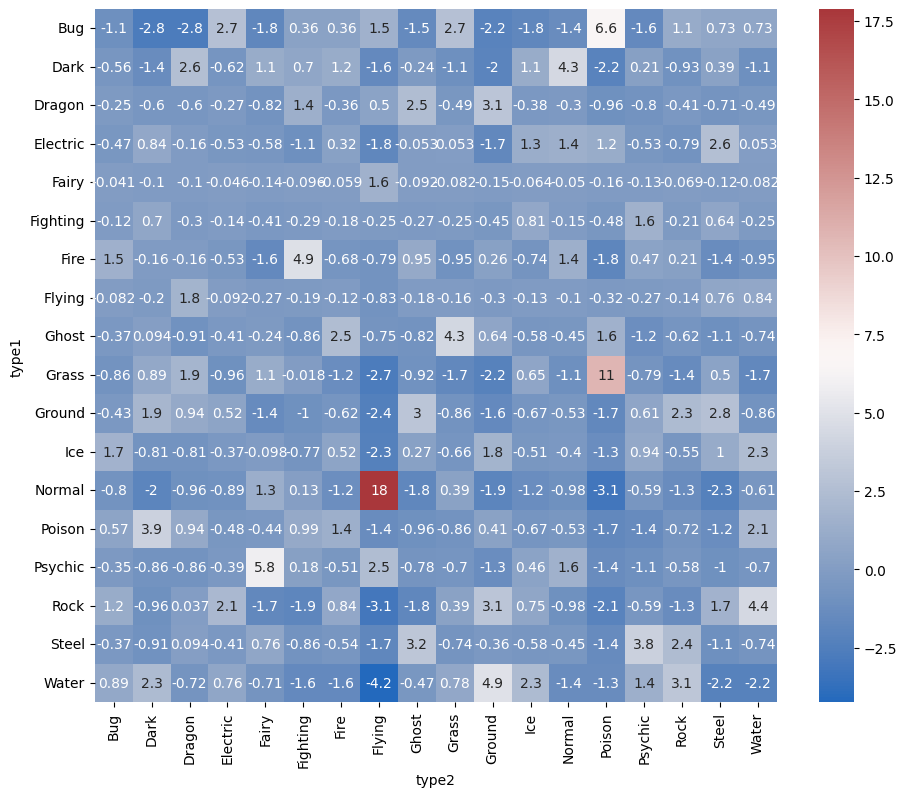

In [81]:
#secondary types seem to heavily dependent on the primary type of the pokemon

#make a heatmap for contingency matrices
plt.figure(figsize=(11, 9))
sns.heatmap(
    types_contingency - types_result.expected_freq,
    cmap='vlag',
    annot=True
)

-------- Chi-square end --------------------------------------------------------------------------------------------------------------------------------

3 ----- K-means Clustering  ----------------------------------------------------------------------------------------------------------------------------

In [82]:
#start with 2 clusters, use the preprocessed data
kmeans = KMeans(n_clusters=2, n_init='auto')
pk_preproc['cluster'] = kmeans.fit_predict(pk_preproc_norm)
pk_preproc.groupby('cluster').mean().T


cluster,0,1
height_m,0.569164,1.441031
weight_kg,15.031988,75.795992
base_total,301.775216,479.335878
hp,49.510086,77.877863
attack,53.760807,88.192748
defense,51.371758,82.118321
sp_attack,47.792507,78.881679
sp_defense,49.0,79.370229
speed,50.340058,72.895038
capture_rate,170.786744,62.007634


In [83]:
#count each cluster
pk_preproc.groupby('cluster').count().T

cluster,0,1
height_m,347,524
weight_kg,347,524
base_total,347,524
hp,347,524
attack,347,524
defense,347,524
sp_attack,347,524
sp_defense,347,524
speed,347,524
capture_rate,347,524


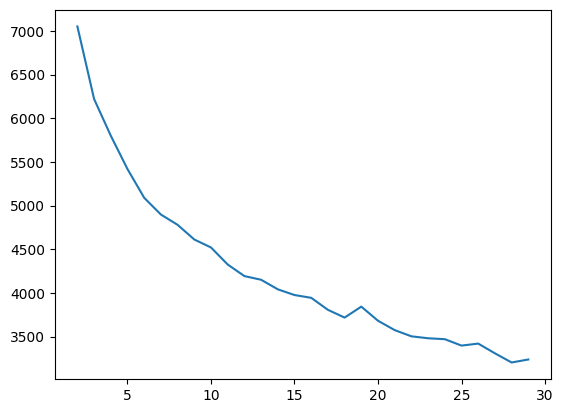

In [84]:
#calculate inertia for optimized clusters

inertias = []

for k in range(2, 30):
  kmeans = KMeans(n_clusters=k, n_init='auto')
  kmeans.fit(pk_preproc_norm)
  inertias.append(kmeans.inertia_)

plt.plot(range(2, 30), inertias)

#suggests 4-9

In [85]:
#k=5 clusters
kmeans = KMeans(n_clusters=5, n_init='auto')
pk_preproc['clusters'] = kmeans.fit_predict(pk_preproc_norm)
pk_preproc.groupby('clusters').mean().T


clusters,0,1,2,3,4
height_m,1.265158,0.755051,0.532083,6.158824,1.492821
weight_kg,43.767421,21.508081,13.458333,501.005882,98.743077
base_total,495.244344,372.838384,284.304167,535.235294,488.641026
hp,75.986425,60.136364,47.325,102.529412,83.010256
attack,81.764706,67.565657,49.895833,110.588235,100.333333
defense,70.221719,60.30303,49.608333,113.941176,100.276923
sp_attack,96.031674,60.878788,44.429167,75.647059,65.087179
sp_defense,81.927602,60.545455,46.3625,82.058824,81.933333
speed,89.312217,63.409091,46.683333,50.470588,58.0
capture_rate,56.411765,81.262626,207.145833,46.941176,65.051282


In [86]:
pk_preproc.groupby('clusters').count().T

clusters,0,1,2,3,4
height_m,221,198,240,17,195
weight_kg,221,198,240,17,195
base_total,221,198,240,17,195
hp,221,198,240,17,195
attack,221,198,240,17,195
defense,221,198,240,17,195
sp_attack,221,198,240,17,195
sp_defense,221,198,240,17,195
speed,221,198,240,17,195
capture_rate,221,198,240,17,195


 ----------- K-means clustering end  -------------------------------------------------------------------------------------------------------------------

4 & 5 ---- Linear Regression & PearsonR ---------------------------------------------------------------------------
#Attack vs Defense | Sp. Attack vs. Sp. Defense | Capture Rate vs Base Total | Weight vs Speed | Sp. Attack vs. Attack | HP vs Defense

<Axes: xlabel='attack', ylabel='defense'>

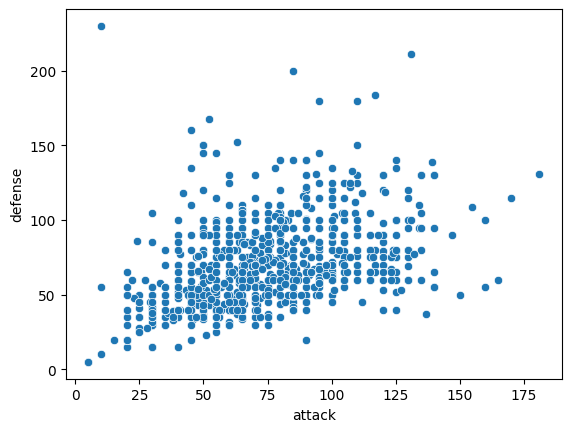

In [87]:
#Attack vs Defense

#converts the numerical data columns to float so regplot does not raise any exceptions due to inconsistent typing
pkmn_floatconv = pd.DataFrame(pkmn_df)
pkmn_floatconv['attack'] = pkmn_floatconv['attack'].astype(float)
pkmn_floatconv['defense'] = pkmn_floatconv['defense'].astype(float)
sns.scatterplot(pkmn_floatconv, x='attack', y='defense')

<Axes: xlabel='attack', ylabel='defense'>

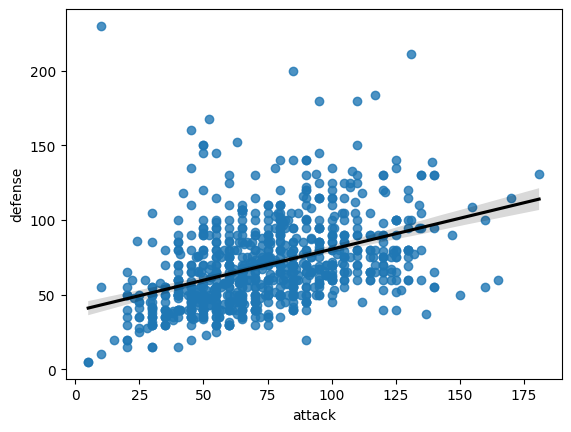

In [88]:
#plots linear regression line
sns.regplot(pkmn_floatconv, x='attack', y='defense', line_kws={'color': 'black'})

In [89]:
#calcs linear regression
linreg_results = stats.linregress(pkmn_floatconv['attack'], pkmn_floatconv['defense'])
linreg_results

LinregressResult(slope=0.41452502625985743, intercept=38.997233750373795, rvalue=0.41989208696821556, pvalue=1.608356242235378e-38, stderr=0.030393816786093143, intercept_stderr=2.4281626915291894)

In [90]:
#check is pearsonr result is similar to the rvalue and pvalue in the linear regression result
stats.pearsonr(pkmn_floatconv['attack'], pkmn_floatconv['defense'])

PearsonRResult(statistic=0.4198920869682154, pvalue=1.6083562422355335e-38)

<Axes: xlabel='sp_attack', ylabel='sp_defense'>

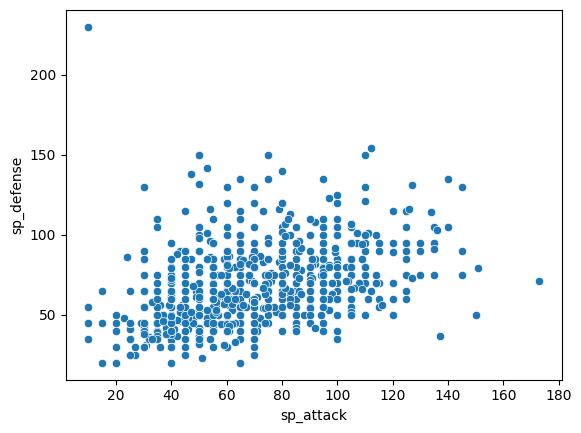

In [91]:
#Sp. Attack vs. Sp. Defense

pkmn_floatconv['sp_attack'] = pkmn_floatconv['sp_attack'].astype(float)
pkmn_floatconv['sp_defense'] = pkmn_floatconv['sp_defense'].astype(float)
sns.scatterplot(pkmn_floatconv, x='sp_attack', y='sp_defense')

<Axes: xlabel='sp_attack', ylabel='sp_defense'>

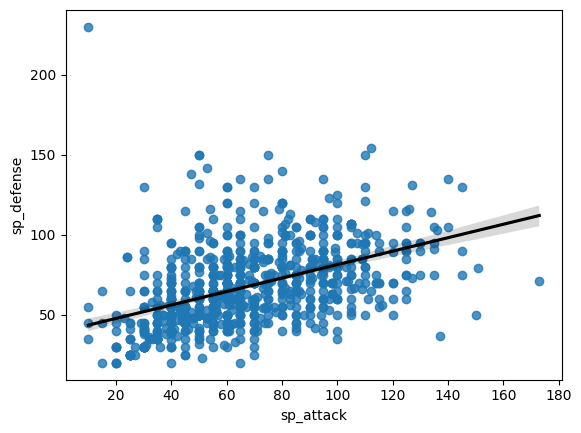

In [92]:
sns.regplot(pkmn_floatconv, x='sp_attack', y='sp_defense', line_kws={'color': 'black'})

In [93]:
linreg_results = stats.linregress(pkmn_floatconv['attack'], pkmn_floatconv['defense'])
linreg_results

LinregressResult(slope=0.41452502625985743, intercept=38.997233750373795, rvalue=0.41989208696821556, pvalue=1.608356242235378e-38, stderr=0.030393816786093143, intercept_stderr=2.4281626915291894)

<Axes: xlabel='base_total', ylabel='capture_rate'>

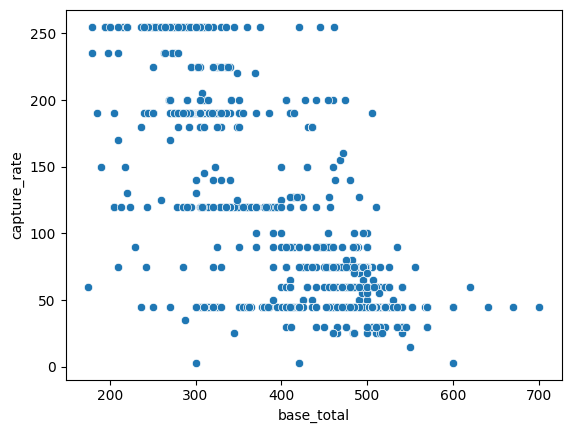

In [94]:
#Capture Rate vs Base Total

pkmn_floatconv['capture_rate'] = pkmn_floatconv['capture_rate'].astype(float)
pkmn_floatconv['base_total'] = pkmn_floatconv['base_total'].astype(float)
sns.scatterplot(pkmn_floatconv, x='base_total', y='capture_rate')

<Axes: xlabel='base_total', ylabel='capture_rate'>

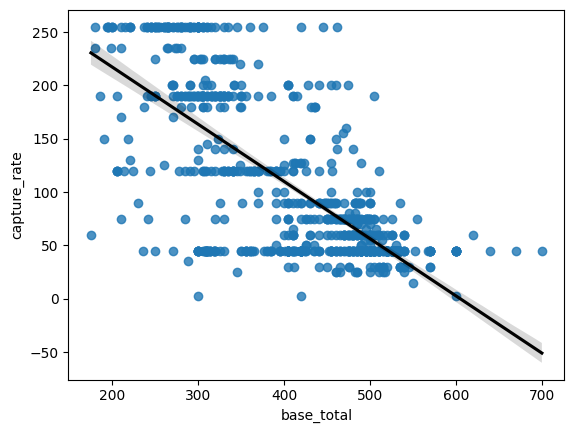

In [95]:
sns.regplot(pkmn_floatconv, x='base_total', y='capture_rate', line_kws={'color': 'black'})

In [96]:
linreg_results = stats.linregress(pkmn_floatconv['base_total'], pkmn_floatconv['capture_rate'])
linreg_results

LinregressResult(slope=-0.5359674146697414, intercept=324.33911741904126, rvalue=-0.7193215204015634, pvalue=1.2146148640508441e-139, stderr=0.017558546095839307, intercept_stderr=7.384541846843259)

<Axes: xlabel='speed', ylabel='weight_kg'>

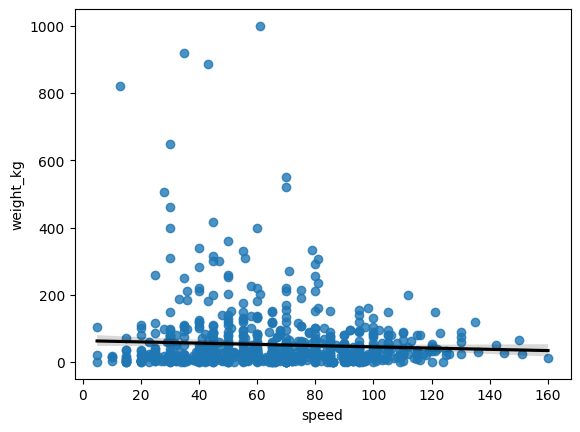

In [97]:
#Weight vs Speed

pkmn_floatconv['weight_kg'] = pkmn_floatconv['weight_kg'].astype(float)
pkmn_floatconv['speed'] = pkmn_floatconv['speed'].astype(float)
sns.regplot(pkmn_floatconv, x='speed', y='weight_kg', line_kws={'color': 'black'})

In [98]:
linreg_results = stats.linregress(pkmn_floatconv['speed'], pkmn_floatconv['weight_kg'])
linreg_results

LinregressResult(slope=-0.18444169838357027, intercept=63.37559947247007, rvalue=-0.05458742998893435, pvalue=0.10741754030749416, stderr=0.11444809228889949, intercept_stderr=7.950336855464071)

<Axes: xlabel='attack', ylabel='sp_attack'>

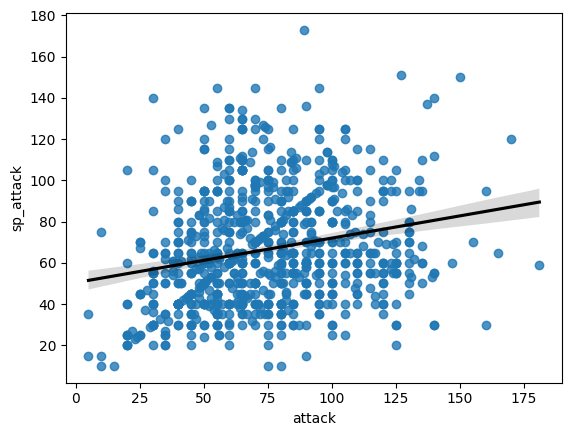

In [99]:
#Attack vs Sp. Attack

sns.regplot(pkmn_floatconv, x='attack', y='sp_attack', line_kws={'color': 'black'})

In [100]:
linreg_results = stats.linregress(pkmn_floatconv['attack'], pkmn_floatconv['sp_attack'])
linreg_results

LinregressResult(slope=0.21581252176099483, intercept=50.42327593387805, rvalue=0.22757383884956903, pvalue=1.0753190174932266e-11, stderr=0.03132540648479879, intercept_stderr=2.50258741304837)

<Axes: xlabel='hp', ylabel='defense'>

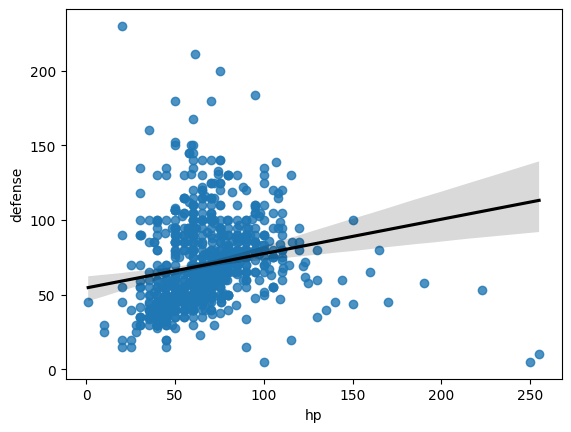

In [101]:
#Defense vs HP

pkmn_floatconv['hp'] = pkmn_floatconv['hp'].astype(float)
sns.regplot(pkmn_floatconv, x='hp', y='defense', line_kws={'color': 'black'})

In [102]:
linreg_results = stats.linregress(pkmn_floatconv['hp'], pkmn_floatconv['defense'])
linreg_results

LinregressResult(slope=0.2299460832722959, intercept=54.560145262004724, rvalue=0.20017554116030373, pvalue=2.5276526615432654e-09, stderr=0.03817902588121611, intercept_stderr=2.7130610876057015)

------------------Linear Regression and PearsonR end ---------------------------------------------------------------------------------------------------

In [103]:
#Running test queries

In [104]:
pkmn_df[pkmn_df['type1'] == 'Normal']

,index,pokedex_number,name,generation,classfication,height_m,weight_kg,type1,type2,base_total,hp,attack,defense,sp_attack,sp_defense,speed,capture_rate
15,20,16,Pidgey,1,Tiny Bird Pokemon,0.3,1.8,Normal,Flying,251,40,45,40,35,35,56,255
16,21,17,Pidgeotto,1,Bird Pokemon,1.1,30.0,Normal,Flying,349,63,60,55,50,50,71,120
17,22,18,Pidgeot,1,Bird Pokemon,1.5,39.5,Normal,Flying,479,83,80,75,70,70,101,45
18,24,19,Rattata,1,Mouse Pokemon,0.3,3.5,Normal,<NA>,253,30,56,35,25,35,72,255
20,26,20,Raticate,1,Mouse Pokemon,0.7,18.5,Normal,<NA>,413,55,81,60,50,70,97,127
22,28,21,Spearow,1,Tiny Bird Pokemon,0.3,2.0,Normal,Flying,262,40,60,30,31,31,70,255
23,29,22,Fearow,1,Beak Pokemon,1.2,38.0,Normal,Flying,442,65,90,65,61,61,100,90
45,51,39,Jigglypuff,1,Balloon Pokemon,0.5,5.5,Normal,Fairy,270,115,45,20,45,25,20,170
46,52,40,Wigglytuff,1,Balloon Pokemon,1.0,12.0,Normal,Fairy,435,140,70,45,85,50,45,50
60,66,52,Meowth,1,Scratch Cat Pokemon,0.4,4.2,Normal,<NA>,290,40,45,35,40,40,90,255


In [105]:
#drop all null values (would drop mainly the ones with type2 nan
pkmn_mod = pkmn_df.dropna().reset_index()
#drop all less relevant columns
pkmn_mod = pkmn_mod.drop(['level_0','index','pokedex_number','name','classfication','generation','type2','capture_rate'], axis=1)


#normalized
num_col = ['height_m', 'weight_kg', 'base_total', 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed']
pkmn_type = pkmn_mod['type1']
pkmn_mod_num = pd.DataFrame(pkmn_mod[num_col]) 
pkmn_mod_norm = pd.concat([
    (pkmn_mod_num - pkmn_mod_num.mean())/pkmn_mod_num.std(),
    pkmn_type
], axis=1)
pkmn_mod_norm

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,type1
0,-0.437973,-0.531576,-1.095254,-0.993306,-0.959093,-0.835172,-0.16859,-0.199144,-0.759283,Grass
1,-0.170787,-0.472338,-0.206791,-0.340693,-0.512376,-0.386333,0.371012,0.385708,-0.208109,Grass
2,0.719832,0.372545,1.018674,0.529458,0.174881,0.254865,1.090482,1.165512,0.526789,Grass
3,0.452647,0.280287,1.110584,0.442443,0.243607,0.094566,1.414243,0.580659,1.261688,Fire
4,-0.081725,-0.287823,-0.308913,-0.340693,-1.096544,-0.803112,0.730747,0.385708,0.15934,Bug
5,-0.79422,-0.567508,-2.351355,-1.210844,-1.440173,-1.444311,-1.787396,-1.953702,-0.575558,Bug
6,-0.527035,-0.501471,-2.249233,-0.993306,-1.783801,-0.803112,-1.607529,-1.758751,-1.126732,Bug
7,-0.170787,-0.312101,-0.308913,-0.123155,0.449784,-1.123712,-0.888059,0.385708,0.343065,Bug
8,-0.79422,-0.581104,-1.779472,-1.210844,-1.096544,-1.123712,-1.247794,-1.36885,-0.355089,Normal
9,-0.081725,-0.307246,-0.778675,-0.21017,-0.581102,-0.642813,-0.708192,-0.783997,0.196085,Normal


6 ----- K-nearest neighbor -----------------------------------------------------------------------------------------------------------------------------

In [106]:
#select the columns that are numerical
X = pkmn_mod_norm.loc[:,'height_m':'speed']
#select the classification column
y =  pkmn_mod_norm['type1']
y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 437 entries, 0 to 436
Series name: type1
Non-Null Count  Dtype 
--------------  ----- 
437 non-null    string
dtypes: string(1)
memory usage: 3.5 KB


In [107]:
#Split into train, test, and validation data sets
#90% train+val, 15% test
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

#80% train, 13% validation of the 80%
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.13, random_state=42)

print(f"Training set size: {X_train.shape[0]}")
print(f"Validation set size: {X_val.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")


Training set size: 341
Validation set size: 52
Test set size: 44


In [108]:
for K in range(1, 10):
  #train k neighbors classifier and train
  knn = KNeighborsClassifier(n_neighbors=K)
  knn.fit(X_train, y_train)

  #compute accuracy
  predictions = knn.predict(X_val)
  print('k:', K, 'accuracy:', metrics.accuracy_score(y_val, predictions))

k: 1 accuracy: 0.19230769230769232
k: 2 accuracy: 0.1346153846153846
k: 3 accuracy: 0.19230769230769232
k: 4 accuracy: 0.21153846153846154
k: 5 accuracy: 0.1346153846153846
k: 6 accuracy: 0.15384615384615385
k: 7 accuracy: 0.17307692307692307
k: 8 accuracy: 0.19230769230769232
k: 9 accuracy: 0.17307692307692307


In [109]:
#use on test set
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train, y_train)
metrics.accuracy_score(y_test, knn.predict(X_test))
#despite the accuracy, 4th has the better result of ~0.27

0.2727272727272727

In [110]:
#Let's run it on a sample Pokemon, with stats randomly generated
test_pkmn = pd.DataFrame({'height_m': [0.4, 1.4], 'weight_kg': [1.0, 50], 'base_total': [203, 362], 'hp': [52, 90],
                          'attack': [36, 100] , 'defense': [55, 70] , 'sp_attack': [40, 57], 'sp_defense': [20,45], 'speed': [30, 50]}, [1,2])


In [111]:
#Is it a Bug type? Is the second Pokemon a Fighting type? 
metrics.accuracy_score(pd.Series(['Bug', 'Fighting']), knn.predict(test_pkmn))

0.0

In [112]:
#6.2) PCA to reduce dimensionality with Knn
pca = PCA()
pca_output = pca.fit_transform(pkmn_mod_norm[num_col])
pca_output.shape

(437, 9)

In [113]:
#check variance ratio
pca.explained_variance_ratio_

array([4.29639767e-01, 1.72214277e-01, 1.27510184e-01, 9.04182492e-02,
       7.35211741e-02, 5.03595930e-02, 2.94200120e-02, 2.69167438e-02,
       2.34514916e-33])

In [114]:
#concat the original normalized df with the pcs_output
pkmn_pca = pd.concat([
    pkmn_mod_norm,
    pd.DataFrame(pca_output, columns=['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7', 'pc8', 'pc9'])
], axis=1)
pkmn_pca.head()

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,type1,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9
0,-0.437973,-0.531576,-1.095254,-0.993306,-0.959093,-0.835172,-0.16859,-0.199144,-0.759283,Grass,-2.010780,0.262463,0.361230,0.663857,0.084418,0.297531,0.367352,-0.093170,6.101886e-16
1,-0.170787,-0.472338,-0.206791,-0.340693,-0.512376,-0.386333,0.371012,0.385708,-0.208109,Grass,-0.541284,-0.278384,0.652190,0.501924,-0.019865,0.141360,0.284528,0.059330,-6.623766e-16
2,0.719832,0.372545,1.018674,0.529458,0.174881,0.254865,1.090482,1.165512,0.526789,Grass,1.931573,-0.551922,0.659484,0.582890,0.213422,-0.086547,0.174256,0.043697,9.944258e-16
3,0.452647,0.280287,1.110584,0.442443,0.243607,0.094566,1.414243,0.580659,1.261688,Fire,1.818949,-1.354350,0.281875,0.447993,0.449985,0.128575,-0.256933,-0.044416,1.177052e-16
4,-0.081725,-0.287823,-0.308913,-0.340693,-1.096544,-0.803112,0.730747,0.385708,0.15934,Bug,-0.667593,-0.649268,0.653350,1.219991,0.262219,0.010544,0.052142,-0.050101,8.498046e-16


<Axes: xlabel='pc3', ylabel='pc4'>

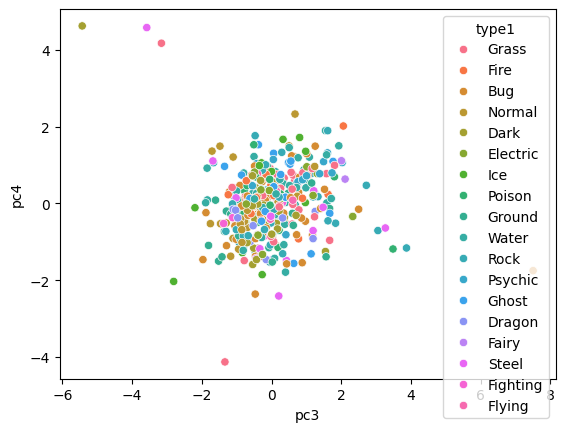

In [115]:
#a visual of attack vs defense pca
sns.scatterplot(pkmn_pca, x='pc3', y='pc4', hue='type1')

In [116]:
#column selection of numericals
X_pca = pkmn_pca.loc[:,'height_m':'speed']
#column selection for classification
y_pca =  pkmn_pca['type1']


In [117]:
#split into train, test, and validation sets
#90% train+val, 15% test
X_train_val_pca, X_test_pca, y_train_val_pca, y_test_pca = train_test_split(X_pca, y_pca, test_size=0.10, random_state=42)

#80% train, 13% validation of the 80%
X_train_pca, X_val_pca, y_train_pca, y_val_pca = train_test_split(X_train_val_pca, y_train_val_pca, test_size=0.13, random_state=42)


In [118]:
for K in range(1, 10):
  #train k neighbors classifier and train
  knn = KNeighborsClassifier(n_neighbors=K)
  knn.fit(X_train_pca, y_train_pca)

  #compute accuracy
  predictions = knn.predict(X_val_pca)
  print('k:', K, 'accuracy:', metrics.accuracy_score(y_val_pca, predictions))

k: 1 accuracy: 0.19230769230769232
k: 2 accuracy: 0.1346153846153846
k: 3 accuracy: 0.19230769230769232
k: 4 accuracy: 0.21153846153846154
k: 5 accuracy: 0.1346153846153846
k: 6 accuracy: 0.15384615384615385
k: 7 accuracy: 0.17307692307692307
k: 8 accuracy: 0.19230769230769232
k: 9 accuracy: 0.17307692307692307


In [119]:
#use on test
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train, y_train)
metrics.accuracy_score(y_test, knn.predict(X_test))
#4th is still the best at ~0.27

0.2727272727272727

In [120]:
#6.3 KNN Binary - Is it water type or no?

In [121]:
#make a copy of the truncated dataframe
pkmn_water = pd.DataFrame(pkmn_mod)

#change all nonwater types to "Not Water" instead of their original types
pkmn_water['type1'] = np.where(pkmn_water['type1'] != 'Water', 'Not Water', pkmn_water['type1'])

#concat all the dataframes
pkmn_type_water = pkmn_water['type1']
pkmn_water_num = pd.DataFrame(pkmn_water[num_col]) 
pkmn_water_norm = pd.concat([
    (pkmn_water_num - pkmn_water_num.mean())/pkmn_water_num.std(),
    pkmn_type_water
], axis=1)
pkmn_water_norm

,height_m,weight_kg,base_total,hp,attack,defense,sp_attack,sp_defense,speed,type1
0,-0.437973,-0.531576,-1.095254,-0.993306,-0.959093,-0.835172,-0.16859,-0.199144,-0.759283,Not Water
1,-0.170787,-0.472338,-0.206791,-0.340693,-0.512376,-0.386333,0.371012,0.385708,-0.208109,Not Water
2,0.719832,0.372545,1.018674,0.529458,0.174881,0.254865,1.090482,1.165512,0.526789,Not Water
3,0.452647,0.280287,1.110584,0.442443,0.243607,0.094566,1.414243,0.580659,1.261688,Not Water
4,-0.081725,-0.287823,-0.308913,-0.340693,-1.096544,-0.803112,0.730747,0.385708,0.15934,Not Water
5,-0.79422,-0.567508,-2.351355,-1.210844,-1.440173,-1.444311,-1.787396,-1.953702,-0.575558,Not Water
6,-0.527035,-0.501471,-2.249233,-0.993306,-1.783801,-0.803112,-1.607529,-1.758751,-1.126732,Not Water
7,-0.170787,-0.312101,-0.308913,-0.123155,0.449784,-1.123712,-0.888059,0.385708,0.343065,Not Water
8,-0.79422,-0.581104,-1.779472,-1.210844,-1.096544,-1.123712,-1.247794,-1.36885,-0.355089,Not Water
9,-0.081725,-0.307246,-0.778675,-0.21017,-0.581102,-0.642813,-0.708192,-0.783997,0.196085,Not Water


In [122]:
X_water = pkmn_water_norm.loc[:,'height_m':'speed']
y_water =  pkmn_water_norm['type1']
y_water.info()

<class 'pandas.core.series.Series'>
RangeIndex: 437 entries, 0 to 436
Series name: type1
Non-Null Count  Dtype 
--------------  ----- 
437 non-null    object
dtypes: object(1)
memory usage: 3.5+ KB


In [123]:
#split into train, test, validation sets
#90% train+val, 15% test
X_train_val_w, X_test_w, y_train_val_w, y_test_w = train_test_split(X_water, y_water, test_size=0.10, random_state=42)

#80% train, 13% validation of the 80%
X_train_w, X_val_w, y_train_w, y_val_w = train_test_split(X_train_val_w, y_train_val_w, test_size=0.13, random_state=42)

In [124]:
for K in range(1, 8):
  #train k neighbors classifier and train
  knn = KNeighborsClassifier(n_neighbors=K)
  knn.fit(X_train_w, y_train_w)

  #compute accuracy
  predictions = knn.predict(X_val_w)
  print('k:', K, 'accuracy:', metrics.accuracy_score(y_val_w, predictions))

k: 1 accuracy: 0.8653846153846154
k: 2 accuracy: 0.9038461538461539
k: 3 accuracy: 0.8461538461538461
k: 4 accuracy: 0.8846153846153846
k: 5 accuracy: 0.8846153846153846
k: 6 accuracy: 0.9230769230769231
k: 7 accuracy: 0.9230769230769231


In [125]:
#use on test set
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_w, y_train_w)
metrics.accuracy_score(y_test_w, knn.predict(X_test))
#3rd and 5th seem to be best

0.7954545454545454

In [126]:
#use on test pokemon set
metrics.accuracy_score(pd.Series(['Water', 'Not Water']), knn.predict(test_pkmn))

0.5

 ----- K-nearest neighbor end --------------------------------------------------------------------------------------------------------------------------

 ---------------------------------------------------------------- Code End  ----------------------------------------------------------------------------